In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import anndata as ad
import glob
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors 
# Inital setting for plot size
from matplotlib import rcParams
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')
def get_top_genes(adata, n_genes=25 ):
    # Get the dictionary of ranked genes
    ranked_genes = adata.uns["rank_genes_groups"]['names']
    # Create a DataFrame to store the top genes for each cluster
    top_genes_df = pd.DataFrame({cluster: ranked_genes[cluster][:n_genes] 
                                 for cluster in ranked_genes.dtype.names})
    
    return top_genes_df

In [2]:
adata = sc.read('/home/dimitris/Workspace/crc/data/integrated_crc.h5ad')
adata.obs['sex'] = adata.obs['sex'].replace({22:'F',2:"F",1:'M'})

Index(['orig.ident', 'nCount_RNA', 'nFeature_RNA', 'log_nCount_RNA',
       'percent_mt', 'pcmito_inrange', 'percent_rb', 'pcribo_inrange',
       'percent_st', 'min_features', 'min_counts', 'timepoint',
       'site_of_biopsy', 'collection_method', 'tumor_type', 'patient_id',
       'cohort', 'age', 'sex', 'bmi', 'comorbidities', 'cancer_family_history',
       'clinical_trials', 'date_of_diagnosis', 'histological_type',
       'histological_variants', 'grade_of_differentiation', 'tumor_size',
       'tumor_location', 'metastatic_diagnosis', 'location_of_metastasis',
       'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts',
       'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt',
       'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo',
       'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb',
       'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'leiden',
       'cell_type'],
      dtype='object')
55


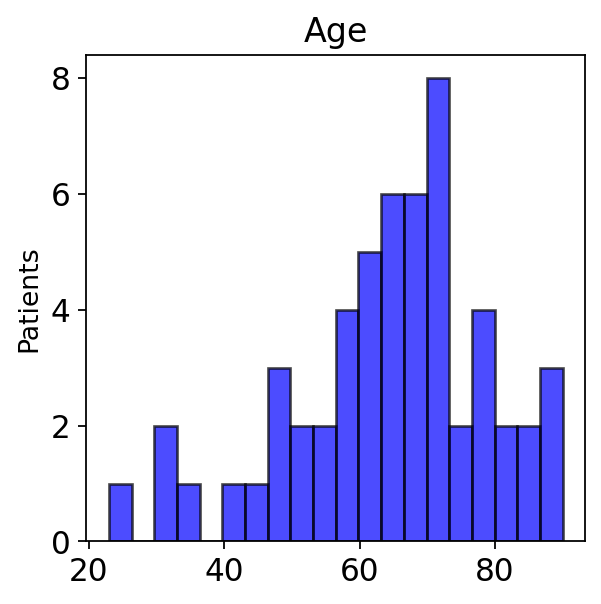

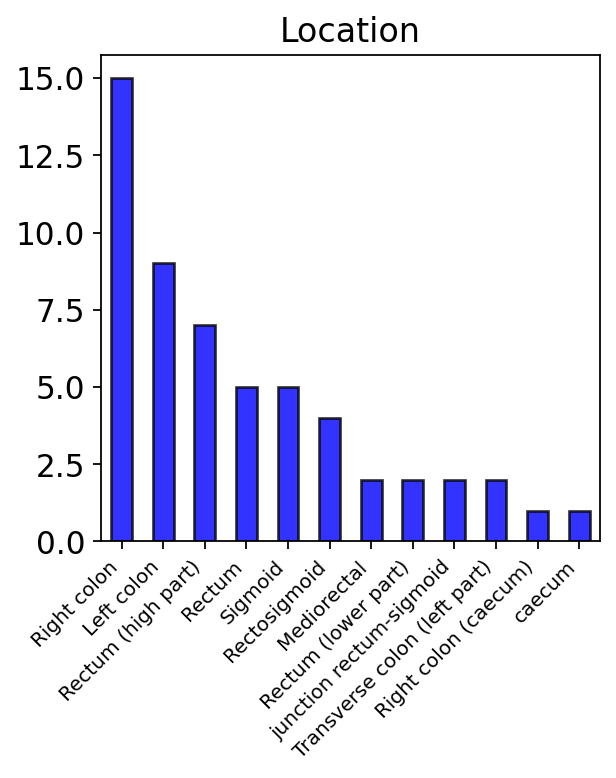

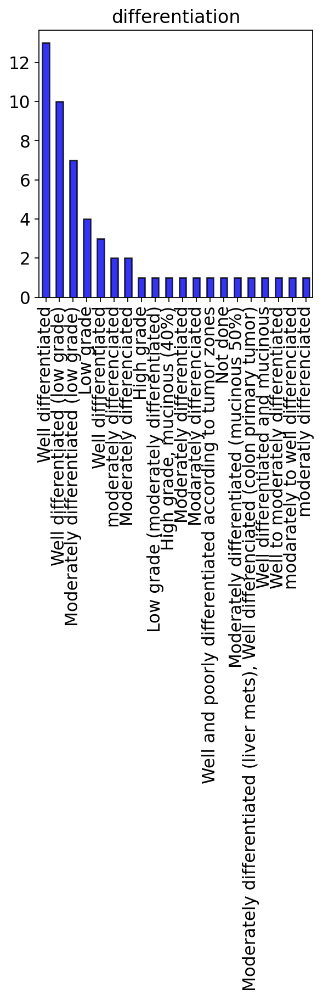

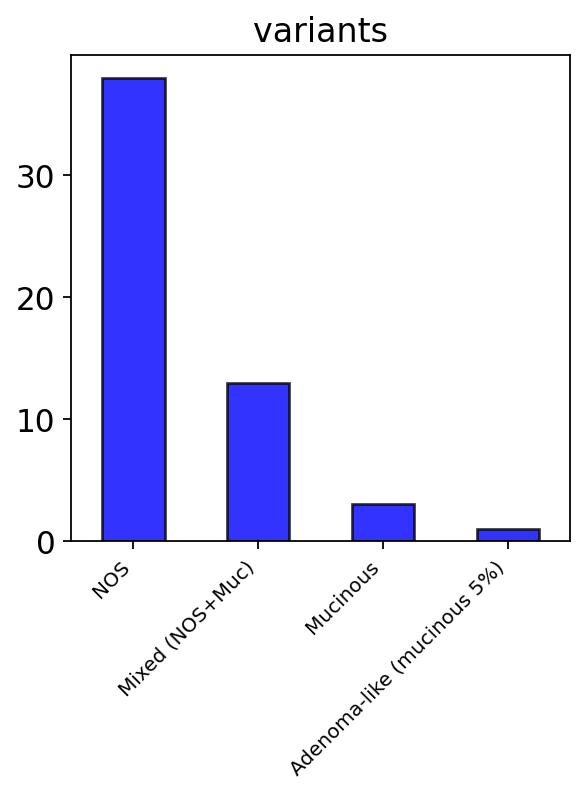

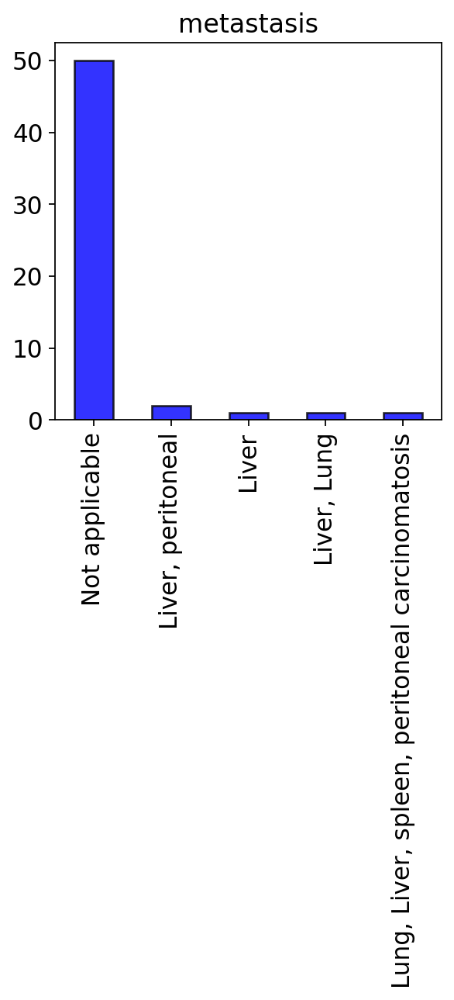

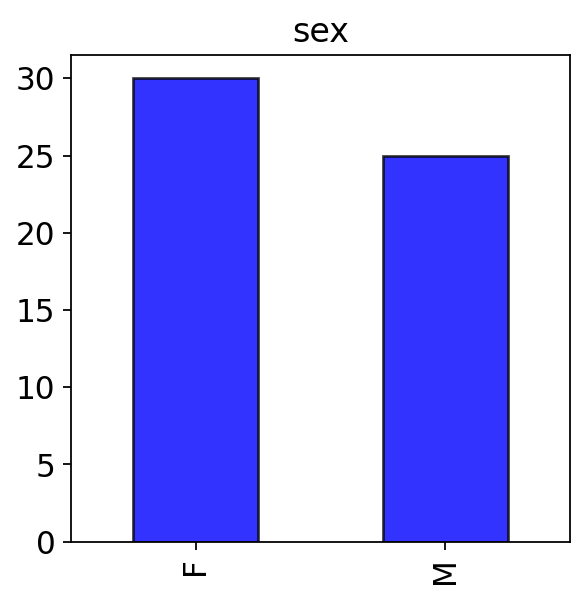

In [4]:
print(adata.obs.columns)
meta = adata.obs[['orig.ident','cohort','age','sex','clinical_trials','grade_of_differentiation','tumor_location','histological_variants','location_of_metastasis','tumor_type','histological_type']].drop_duplicates()
print(len(meta))
meta['age'].plot(kind='hist', bins=20, alpha=0.7, color='blue', edgecolor='black', linewidth=1.2)
plt.title('Age', fontsize=15)
plt.ylabel('Patients', fontsize=12)
plt.grid(False)
plt.show()
meta['tumor_location'].value_counts().plot(kind='bar', alpha=0.8, color='blue', edgecolor='black', linewidth=1.2)
plt.title('Location', fontsize=15)
plt.xlabel('')
plt.xticks(rotation= 45,ha='right', fontsize =9 )
plt.grid(False)
plt.show()

meta['grade_of_differentiation'].value_counts().plot(kind='bar', alpha=0.8, color='blue', edgecolor='black', linewidth=1.2)
plt.title('differentiation', fontsize=15)
plt.xlabel('')
plt.grid(False)
plt.show()

meta['histological_variants'].value_counts().plot(kind='bar', alpha=0.8, color='blue', edgecolor='black', linewidth=1.2)
plt.title('variants', fontsize=15)
plt.xlabel('')
plt.xticks(rotation= 45,ha='right', fontsize =9 )
plt.grid(False)
plt.show()

meta['location_of_metastasis'].value_counts().plot(kind='bar', alpha=0.8, color='blue', edgecolor='black', linewidth=1.2)
plt.title('metastasis', fontsize=15)
plt.xlabel('')
plt.grid(False)
plt.show()

meta['sex'].value_counts().plot(kind='bar', alpha=0.8, color='blue', edgecolor='black', linewidth=1.2)
plt.title('sex', fontsize=15)
plt.xlabel('')
plt.grid(False)
plt.show()

In [5]:
adata

AnnData object with n_obs × n_vars = 73920 × 6892
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'log_nCount_RNA', 'percent_mt', 'pcmito_inrange', 'percent_rb', 'pcribo_inrange', 'percent_st', 'min_features', 'min_counts', 'timepoint', 'site_of_biopsy', 'collection_method', 'tumor_type', 'patient_id', 'cohort', 'age', 'sex', 'bmi', 'comorbidities', 'cancer_family_history', 'clinical_trials', 'date_of_diagnosis', 'histological_type', 'histological_variants', 'grade_of_differentiation', 'tumor_size', 'tumor_location', 'metastatic_diagnosis', 'location_of_metastasis', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'leiden', 'cell_type'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts'

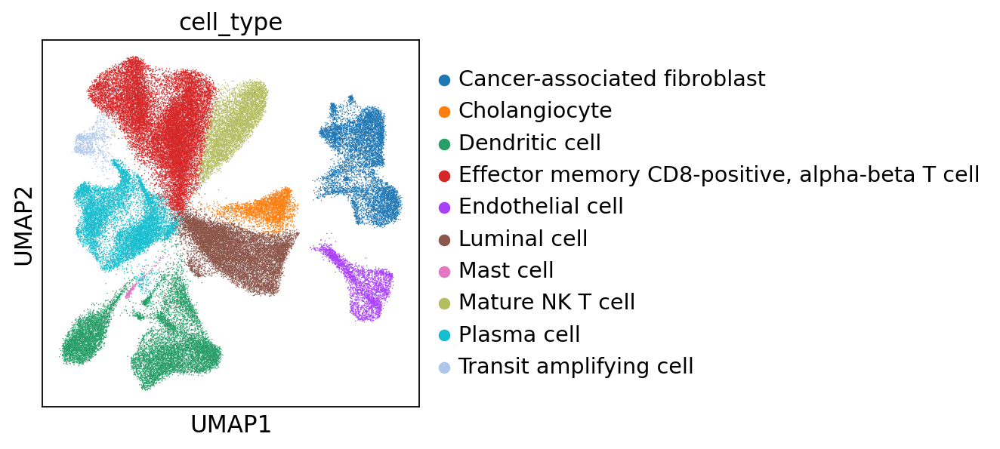

In [7]:
import scanpy as sc
sc.pl.umap(adata, color='cell_type')

/tmp/ipykernel_16521/1965529091.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cell_counts = metadata.groupby(["cell_type"]).apply(len)
/tmp/ipykernel_16521/1965529091.py:5: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  cell_counts = metadata.groupby(["cell_type"]).apply(len)
/tmp/ipykernel_16521/1965529091.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the fut

ValueError: 'Monocyte' is not in list

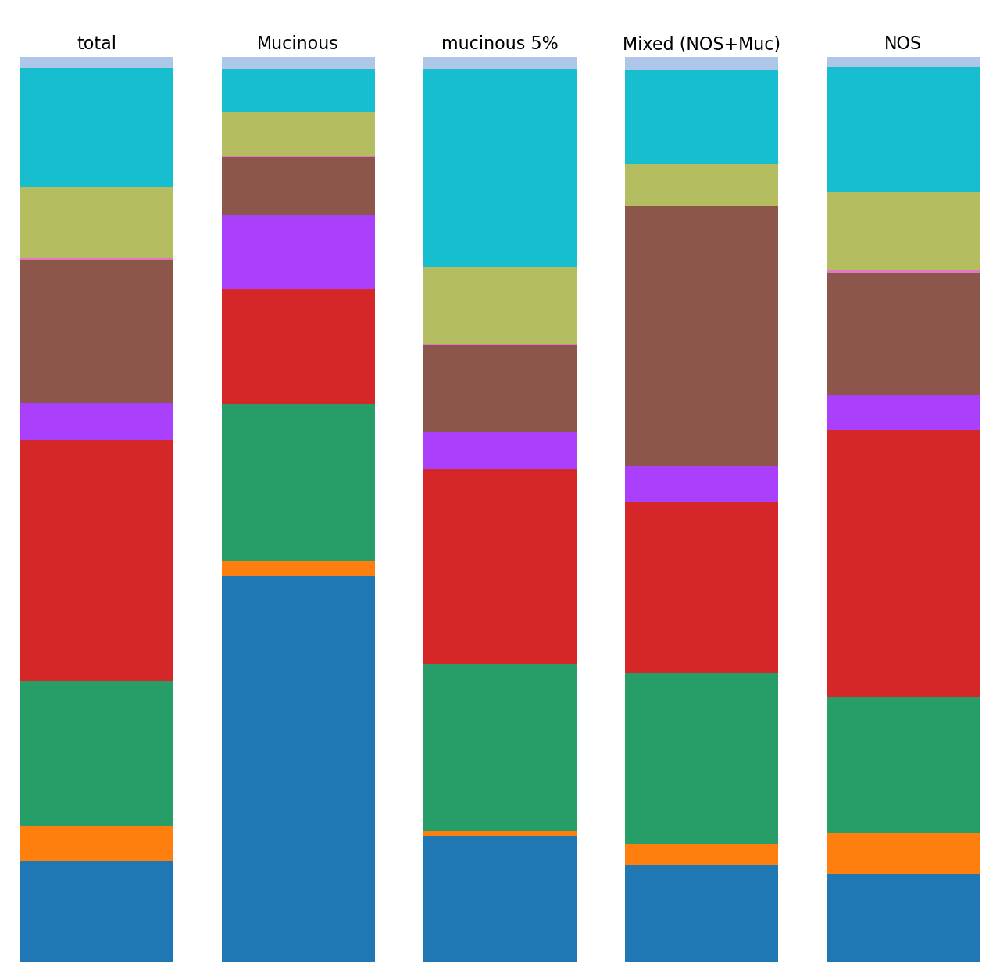

In [9]:
def freq_(x,a):
    return round((x*100)/a,2)

def stacked_barplot(ax,metadata,title):
    cell_counts = metadata.groupby(["cell_type"]).apply(len)
    freqs = cell_counts.apply(freq_,a= sum(cell_counts))
    bottom = np.zeros(1)
    width = 1
    for type_, freq in freqs.items():
        p = ax.bar('freqs',freq, width=0.1, label=type_, bottom=bottom)
        bottom += freq
   
    ax.set_title(title,fontsize= 10, y=0.95,  loc='center', va='baseline')
 
    return ax, freqs
    
fig, axs = plt.subplots(1, 5, figsize=(10, 10))
axs[0],_ = stacked_barplot(axs[0],adata.obs,"total")
axs[0].axis('off')

for i, variant in enumerate(['Mucinous','Adenoma-like (mucinous 5%)','Mixed (NOS+Muc)','NOS']):
    sub = adata.obs[adata.obs['histological_variants'] == variant]
    variant = 'mucinous 5%' if variant == 'Adenoma-like (mucinous 5%)' else variant
    axs[i +1], freqs = stacked_barplot(axs[i+1],sub,variant)
    axs[i +1].axis('off')
    
order = ['Effector memory CD8-positive, alpha-beta T cell', 'Monocyte', 'Fibroblast', 'Epithelial', 'Endothelial', 'B cell','Plasma cell']
handles, labels = plt.gca().get_legend_handles_labels()
ordered_handles = [handles[labels.index(item)] for item in order]
ordered_labels = [item for item in order]
plt.legend(ordered_handles, ordered_labels,bbox_to_anchor=(1.05, 1.0))    
plt.grid(False)
plt.axis('off')                    
plt.tight_layout()
plt.show()

computing PCA
    with n_comps=50
    finished (0:00:13)


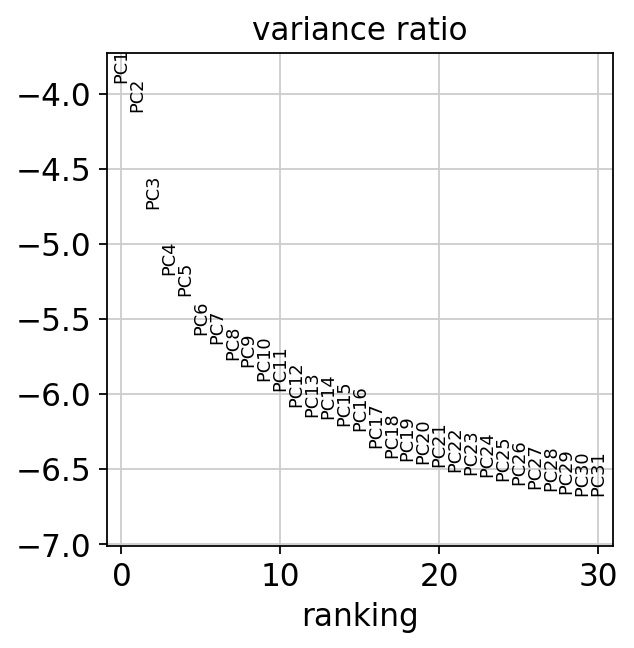

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:08)
computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:06)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:15)
running Leiden clustering


/tmp/ipykernel_15611/2892070528.py:21: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(subset,resolution = 0.5,key_added = 'clusters')


    finished: found 5 clusters and added
    'clusters', the cluster labels (adata.obs, categorical) (0:00:08)


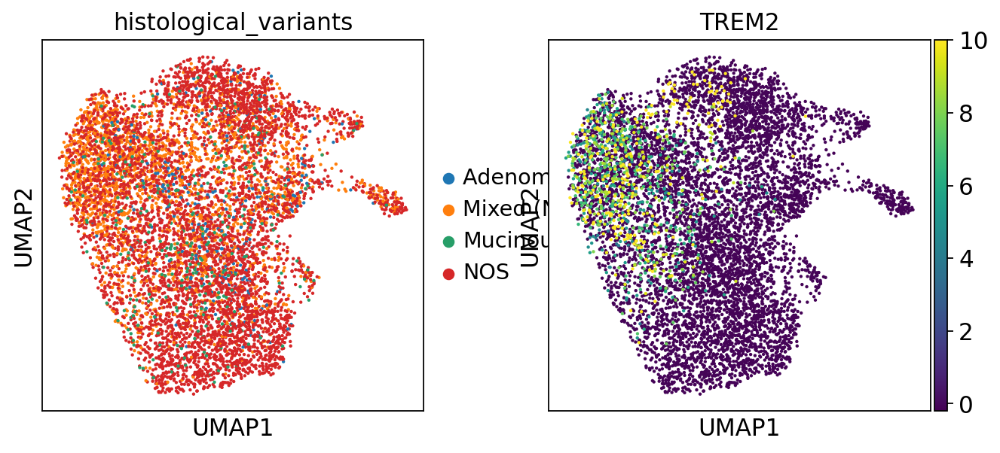

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:08)


/home/dimitris/Workspace/miniconda/envs/sc_analysis/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:482: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/dimitris/Workspace/miniconda/envs/sc_analysis/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:482: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/dimitris/Workspace/miniconda/envs/sc_analysis/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:482: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/dimitris/Workspace/miniconda/envs/sc_analysis/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:482: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/dimitris/Workspace/miniconda/envs/sc_analysis/lib/python3.10/site-packages/scanpy/tools/_rank_

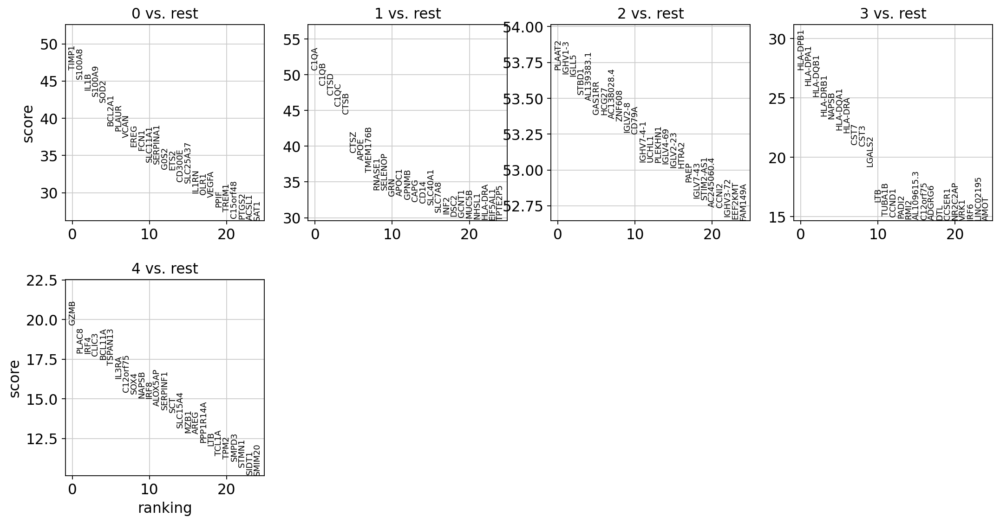

In [18]:
subset = adata[adata.obs['cell_type'].isin(['Monocyte']), :].copy()

#sc.pl.highest_expr_genes(subset, n_top=20)
subset.uns['log1p']["base"] = None
#print(subset.X)
#sc.pp.normalize_total(subset, target_sum=1e4)
#sc.pp.highly_variable_genes(subset, min_mean=0.0125, max_mean=3, min_disp=0.5)
#sc.pp.highly_variable_genes(subset, n_bins = 20)
#sc.pl.highly_variable_genes(subset)
#subset = subset[:, subset.var.highly_variable]
subset.raw = subset
#sc.pp.regress_out(subset, ["total_counts", "pct_counts_mt"])
#sc.pp.scale(subset, max_value=10)

sc.tl.pca(subset, svd_solver="arpack")
sc.pl.pca_variance_ratio(subset, log=True)
sc.pp.neighbors(subset, n_neighbors=10, n_pcs=50)
sc.tl.umap(subset)
sc.external.pp.bbknn(subset, batch_key='orig.ident',neighbors_within_batch =1)
sc.tl.umap(subset)
sc.tl.leiden(subset,resolution = 0.5,key_added = 'clusters')
sc.pl.umap(subset, color=['histological_variants', 'TREM2'])

sc.tl.rank_genes_groups(subset, groupby="clusters", method="wilcoxon")

#sc.pl.heatmap(subset, marker_genes_dict, groupby="clusters" ,cmap="RdBu_r", dendrogram=True, swap_axes=True, figsize=(11, 4))
sc.pl.rank_genes_groups(subset,groupby = 'clusters', n_genes=25, sharey=False)

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_clusters']`


{'heatmap_ax': <Axes: >,
 'groupby_ax': <Axes: xlabel='clusters'>,
 'dendrogram_ax': <Axes: >,
 'gene_groups_ax': <Axes: >}

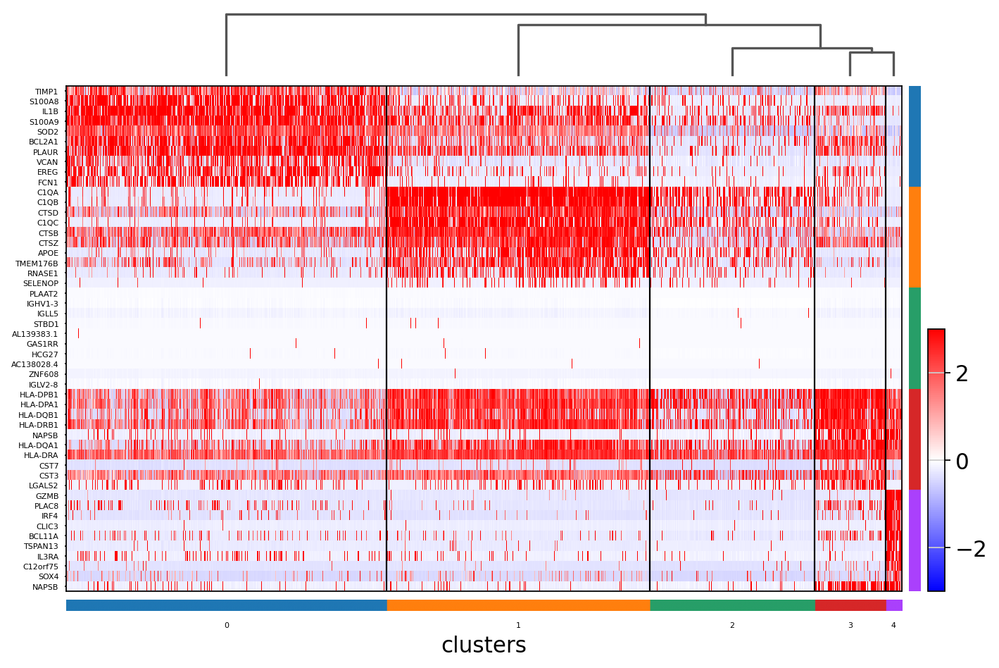

In [19]:
plt.rcParams['font.size'] = 6
sc.pl.rank_genes_groups_heatmap(subset, n_genes=10, use_raw=False, swap_axes=True, show_gene_labels=True, vmin=-3, vmax=3, cmap="bwr",  figsize=(10, 7), show=False)
#sc.pl.rank_genes_groups_heatmap(subset, n_genes=10, use_raw=True, swap_axes=True, show_gene_labels=False, vmin=-3, vmax=3, cmap="bwr")

0 : TIMP1, S100A8, IL1B, S100A9, SOD2, BCL2A1, PLAUR, VCAN, EREG, FCN1, SLC11A1, SERPINA1, G0S2, ETS2, CD300E, SLC25A37, IL1RN, OLR1, VEGFA, PPIF, TREM1, C15orf48, PTGS2, ACSL1, SAT1
1 : C1QA, C1QB, CTSD, C1QC, CTSB, CTSZ, APOE, TMEM176B, RNASE1, SELENOP, GRN, APOC1, GPNMB, CAPG, CD14, SLC40A1, SLC7A8, INF2, DSC2, GCNT1, MUC5B, NHSL1, HLA-DRA, EIF5AL1, TPTE2P5
2 : PLAAT2, IGHV1-3, IGLL5, STBD1, AL139383.1, GAS1RR, HCG27, AC138028.4, ZNF608, IGLV2-8, CD79A, IGHV7-4-1, UCHL1, PLEKHN1, IGLV4-69, IGLV2-23, HTRA2, PAEP, IGLV7-43, STIM2-AS1, AC245060.4, CCNI2, IGHV3-72, EEF2KMT, FAM149A
3 : HLA-DPB1, HLA-DPA1, HLA-DQB1, HLA-DRB1, NAPSB, HLA-DQA1, HLA-DRA, CST7, CST3, LGALS2, LTB, TUBA1B, CCND1, PADI2, RMI2, AL109615.3, C12orf75, ADGRG6, DTL, CCSER1, NR2C2AP, VRK1, IRF6, LINC02195, AMOT
4 : GZMB, PLAC8, IRF4, CLIC3, BCL11A, TSPAN13, IL3RA, C12orf75, SOX4, NAPSB, IRF8, ALOX5AP, SERPINF1, SCT, SLC15A4, MZB1, AREG, PPP1R14A, LTB, TCL1A, TPM2, SMPD3, STMN1, SIDT1, SMIM20


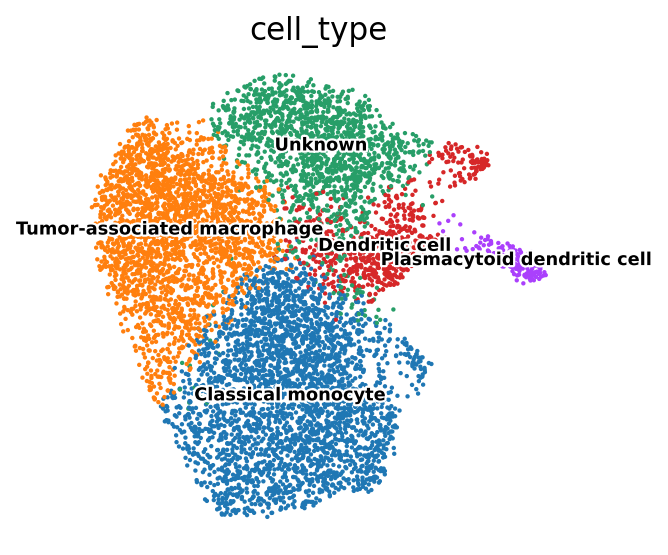

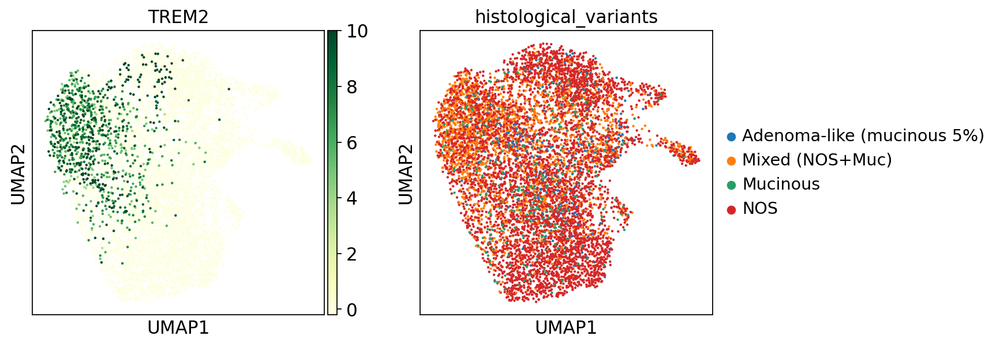

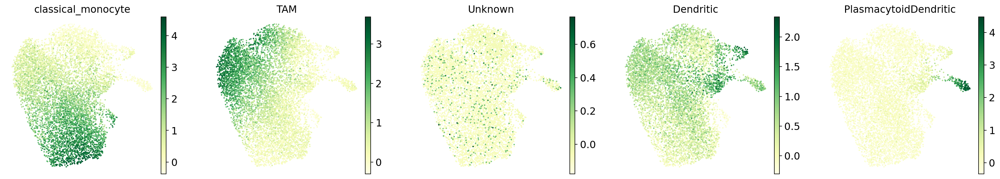

In [20]:
top_genes = get_top_genes(subset, n_genes=25)
for i in top_genes.columns:
    gene_markers =top_genes[i].to_list()  # Replace with your actual gene list
    print(i,':', ', '.join(gene_markers))
    # put results to http://xteam.xbio.top/ACT/ResultAction.action?jobID=20240628063549UAWQVFE7YRSQ15


cluster_annotations = {
    "0":"Classical monocyte",
    "1":"Tumor-associated macrophage",
    "2":"Unknown",
    "3":"Dendritic cell",
    "4":"Plasmacytoid dendritic cell"
}
subset.obs["cell_type"] = subset.obs["clusters"].map(cluster_annotations).astype("category")

sc.settings.set_figure_params(dpi=80, facecolor='white')
#plt.axes('off')
sc.pl.umap(subset, color='cell_type',legend_loc="on data",frameon=False,legend_fontsize=8,legend_fontoutline=2,)
sc.pl.umap(subset, color=['TREM2','histological_variants'],cmap="YlGn")

classical_monocyte =  ['TIMP1', 'S100A8', 'IL1B', 'S100A9', 'SOD2', 'BCL2A1', 'PLAUR', 'VCAN', 'EREG', 'FCN1', 'SLC11A1', 'SERPINA1', 'G0S2', 'ETS2', 'CD300E', 'SLC25A37', 'IL1RN', 'OLR1', 'VEGFA', 'PPIF', 'TREM1', 'C15orf48', 'PTGS2', 'ACSL1', 'SAT1']
TAM = ['C1QA', 'C1QB', 'CTSD', 'C1QC', 'CTSB', 'CTSZ', 'APOE', 'TMEM176B', 'RNASE1', 'SELENOP', 'GRN', 'APOC1', 'GPNMB', 'CAPG', 'CD14', 'SLC40A1', 'SLC7A8', 'INF2', 'DSC2', 'GCNT1', 'MUC5B', 'NHSL1', 'HLA-DRA', 'EIF5AL1', 'TPTE2P5']
Unknown = ['PLAAT2', 'IGHV1-3', 'IGLL5', 'STBD1', 'AL139383.1', 'GAS1RR', 'HCG27', 'AC138028.4', 'ZNF608', 'IGLV2-8', 'CD79A', 'IGHV7-4-1', 'UCHL1', 'PLEKHN1', 'IGLV4-69', 'IGLV2-23', 'HTRA2', 'PAEP', 'IGLV7-43', 'STIM2-AS1', 'AC245060.4', 'CCNI2', 'IGHV3-72', 'EEF2KMT', 'FAM149A']
Dendritic= ['HLA-DPB1', 'HLA-DPA1', 'HLA-DQB1', 'HLA-DRB1', 'NAPSB', 'HLA-DQA1', 'HLA-DRA', 'CST7', 'CST3', 'LGALS2', 'LTB', 'TUBA1B', 'CCND1', 'PADI2', 'RMI2', 'AL109615.3', 'C12orf75', 'ADGRG6', 'DTL', 'CCSER1', 'NR2C2AP', 'VRK1', 'IRF6', 'LINC02195', 'AMOT']
PlasmacytoidDendritic = ['GZMB', 'PLAC8', 'IRF4', 'CLIC3', 'BCL11A', 'TSPAN13', 'IL3RA', 'C12orf75', 'SOX4', 'NAPSB', 'IRF8', 'ALOX5AP', 'SERPINF1', 'SCT', 'SLC15A4', 'MZB1', 'AREG', 'PPP1R14A', 'LTB', 'TCL1A', 'TPM2', 'SMPD3', 'STMN1', 'SIDT1', 'SMIM20']
subset.obs['classical_monocyte'] = np.mean([subset.X[:, subset.var_names == gene].sum(axis=1) for gene in classical_monocyte], axis=0)
subset.obs['TAM'] = np.mean([subset.X[:, subset.var_names == gene].sum(axis=1) for gene in TAM], axis=0)
subset.obs['Unknown'] = np.mean([subset.X[:, subset.var_names == gene].sum(axis=1) for gene in Unknown], axis=0)
subset.obs['Dendritic'] = np.mean([subset.X[:, subset.var_names == gene].sum(axis=1) for gene in Dendritic], axis=0)
subset.obs['PlasmacytoidDendritic'] = np.mean([subset.X[:, subset.var_names == gene].sum(axis=1) for gene in PlasmacytoidDendritic], axis=0)
# Plot the UMAP with aggregate expression
sc.pl.umap(subset, color=['classical_monocyte','TAM','Unknown','Dendritic','PlasmacytoidDendritic'], 
           legend_loc="on data",
           frameon=False,
           ncols=5, cmap="YlGn"
          )

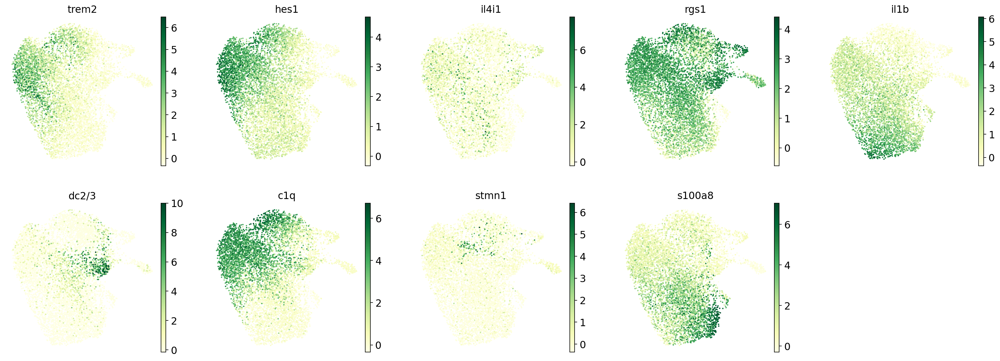

In [21]:
marker_genes_dict = {
    "TREM2":["TREM2","APOC1","APOE","SPP1","FABP5","LGALS3","CD9","LIPA"],
    "HES1":["HES1","C1QA","C1QB","C1QC","CCL3","CCL4","HBEGF","APOE","LIPA","CCL18"],
    "IL4I1":["IL4I1","IDO1","CXCL9","CXCL10","CXCL11","CD40","CCL8","LAMP3"],
    "RGS1":["RGS1",'HLA-DRB1','HLA-DPB1'],
    "IL1B":['VEGFA','CCL20','IL1RN','CXCL2','CXCL3','EREG','PLAUR','CCL4','TNFAIP3','CD44'],
    "DC2/3":['FCER1A','CLEC10A','CD1C','CD1E','CD74'],
    "C1Q":['C1Q','C1QA','C1QB','C1QB','C1QC','HLA-DRB1'],
    'STMN1':['STMN1','TUBB','TOP2A','HMGB2','CDK1','MKI67'],
    'S100A8':['S100A8','S100A9','S100A12','VCAN','S100A6','FOS','LYZ','HMGB2','KLF6']
}
non_existent = ['C1Q', 'CD44', 'CD74', 'FOS', 'HMGB2', 'KLF6', 'RGS1', 'S100A6', 'TNFAIP3', 'TUBB']

for key in marker_genes_dict:
    marker_genes_dict[key] = [item for item in marker_genes_dict[key] if item not in non_existent]
    subset.obs[key.lower()] = np.mean([subset.X[:, subset.var_names == gene].sum(axis=1) for gene in marker_genes_dict[key]], axis=0)
    
sc.pl.umap(subset, color=[x.lower() for x in marker_genes_dict.keys()], 
           legend_loc="on data",
           frameon=False,
           ncols=5, cmap="YlGn"
          )

In [22]:
normalize = lambda x: (x - x.min()) / (x.max() - x.min())
import numpy as np
from sklearn.metrics import mutual_info_score
import warnings
from scipy.special import kl_div
from sklearn.metrics.pairwise import cosine_similarity
from scipy.spatial.distance import hamming
def kl_divergence_binary(p, q):
    # Convert to numpy arrays
    p = np.array(p)
    q = np.array(q)
    
    # Check if inputs are binary
    if not set(p).issubset({0, 1}) or not set(q).issubset({0, 1}):
        raise ValueError("Inputs must be binary (0s and 1s only)")
    
    # Calculate probabilities
    p_1 = np.mean(p)
    p_0 = 1 - p_1
    q_1 = np.mean(q)
    q_0 = 1 - q_1
    
    # Avoid log(0) by adding a small epsilon
    epsilon = 1e-10
    
    # Calculate KL divergence
    kl = p_0 * np.log((p_0 + epsilon) / (q_0 + epsilon)) + p_1 * np.log((p_1 + epsilon) / (q_1 + epsilon))
    
    return kl

def mutual_information(x, y):
    x = np.array(x).astype(int)
    y = np.array(y).astype(int)
    
    if not set(x).issubset({0, 1}) or not set(y).issubset({0, 1}):
        raise ValueError("Inputs must be binary (0s and 1s only)")
    
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        mi = mutual_info_score(x, y)
    return mi

def entropy(x):
    p1 = np.mean(x)
    p0 = 1 - p1
    return -p0 * np.log2(p0) - p1 * np.log2(p1) if 0 < p0 < 1 else 0

def cross_entropy_loss(y_true, y_pred):
  
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    
    # Check input validity
    if not set(y_true).issubset({0, 1}):
        raise ValueError("y_true must contain only binary values (0 or 1)")
    if np.any((y_pred < 0) | (y_pred > 1)):
        raise ValueError("y_pred must contain values between 0 and 1")
    
    # Avoid log(0) by clipping predictions
    epsilon = 1e-15
    y_pred = np.clip(y_pred, epsilon, 1 - epsilon)
    
    # Calculate cross-entropy loss
    loss = -np.mean(y_true * np.log(y_pred) + (1 - y_true) * np.log(1 - y_pred))
    
    return loss

def hamming_distance(x, y):
    """Calculate the Hamming distance between two binary vectors."""
    x, y = np.array(x), np.array(y)
    if not (set(x).issubset({0, 1}) and set(y).issubset({0, 1})):
        raise ValueError("Inputs must be binary (0s and 1s only)")
    return hamming(x, y) * len(x)

def jaccard_similarity(x, y):
    """Calculate the Jaccard similarity between two binary vectors."""
    x, y = np.array(x), np.array(y)
    if not (set(x).issubset({0, 1}) and set(y).issubset({0, 1})):
        raise ValueError("Inputs must be binary (0s and 1s only)")
    intersection = np.logical_and(x, y)
    union = np.logical_or(x, y)
    return np.sum(intersection) / np.sum(union)

def cosine_similarity_binary(x, y):
    """Calculate the cosine similarity between two binary vectors."""
    x, y = np.array(x).reshape(1, -1), np.array(y).reshape(1, -1)
    if not (set(x[0]).issubset({0, 1}) and set(y[0]).issubset({0, 1})):
        raise ValueError("Inputs must be binary (0s and 1s only)")
    return cosine_similarity(x, y)[0][0]

def phi_coefficient(x, y):
    """Calculate the phi coefficient (correlation) between two binary vectors."""
    x, y = np.array(x), np.array(y)
    if not (set(x).issubset({0, 1}) and set(y).issubset({0, 1})):
        raise ValueError("Inputs must be binary (0s and 1s only)")
    n = len(x)
    sum_x = np.sum(x)
    sum_y = np.sum(y)
    sum_xy = np.sum(x * y)
    
    numerator = n * sum_xy - sum_x * sum_y
    denominator = np.sqrt((n * sum_x - sum_x**2) * (n * sum_y - sum_y**2))
    
    if denominator == 0:
        return 0  # To handle the case where one or both vectors are all 0s or all 1s
    return numerator / denominator

res =  []
for histo in set(subset.obs['histological_variants']):
    histo_cells = [1  if histo == row['histological_variants'] else 0 for index,row in subset.obs.iterrows()]
    for name in marker_genes_dict.keys():
        array = subset.obs[name.lower()]
        binarized_expression = [1 if x > 0.5 else 0 for x in normalize(array)]
        mi = mutual_information(histo_cells, binarized_expression)
        h_x = entropy(histo_cells)
        h_y = entropy(binarized_expression)
        kl = kl_divergence_binary(histo_cells, binarized_expression)
        ce = cross_entropy_loss(histo_cells, binarized_expression)
        pc = phi_coefficient(histo_cells,binarized_expression)
        cs = cosine_similarity_binary(histo_cells,binarized_expression)
        hd = hamming_distance(histo_cells,binarized_expression)
        js = jaccard_similarity(histo_cells,binarized_expression)
        d = {"Method":"%s - %s"%(histo,name),"Kullback-Leibler Divergence":kl,"Mutual Information":mi / np.sqrt(h_x * h_y),"Cross-Entropy":ce,'Phi coefficient':pc,'Cosine Similarity':cs,'Hamming Distance':hd,'Jaccard Similarity':js}
        res.append(d)
       
df = pd.DataFrame(res)        
display(df)

,Method,Kullback-Leibler Divergence,Mutual Information,Cross-Entropy,Phi coefficient,Cosine Similarity,Hamming Distance,Jaccard Similarity
0,NOS - TREM2,1.234198,0.002662,22.236949,-0.054647,0.160226,4989.0,0.045533
1,NOS - HES1,0.473551,0.005238,21.586249,-0.093891,0.310529,4843.0,0.151839
2,NOS - IL4I1,2.267490,0.000784,22.361733,-0.021623,0.072589,5017.0,0.009477
3,NOS - RGS1,0.052802,0.014934,20.195704,-0.169522,0.490149,4531.0,0.320282
4,NOS - IL1B,0.981459,0.007738,20.659096,0.094553,0.288473,4635.0,0.101744
5,NOS - DC2/3,1.582818,0.001727,22.299341,-0.039692,0.122379,5003.0,0.026843
6,NOS - C1Q,0.277908,0.005174,20.895411,-0.097254,0.383785,4688.0,0.215266
7,NOS - STMN1,2.518105,0.006876,22.495449,-0.059916,0.034891,5047.0,0.003750
8,NOS - S100A8,0.797519,0.004207,20.436246,0.074651,0.314720,4585.0,0.126833
9,Adenoma-like (mucinous 5%) - TREM2,0.004552,0.004998,3.182480,-0.041368,0.005715,714.0,0.002793


In [24]:
import numpy as np
from scipy import stats
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scikit_posthocs as sp

def kruskal_wallis_test(values, categories):
    """
    Perform Kruskal-Wallis H-test on continuous values grouped by categories.
    
    Args:
    values (list or np.array): Continuous values
    categories (list or np.array): Corresponding categories for each value
    
    Returns:
    dict: A dictionary containing the test statistic, p-value, and a summary DataFrame
    """
    h_statistic, p_value = stats.kruskal(*[values[np.array(categories) == cat] for cat in set(categories)])
    summary = pd.DataFrame({
        'Category': list(set(categories)),
        'Count': [np.sum(np.array(categories) == cat) for cat in set(categories)],
        'Mean Rank': [np.mean(stats.rankdata(values)[np.array(categories) == cat]) for cat in set(categories)]
    })
    
    return {
        'H-statistic': h_statistic,
        'p-value': p_value,
        'summary': summary
    }

def dunns_test(values, categories):
    """
    Perform Dunn's test for pairwise comparisons.
    
    Args:
    values (list or np.array): Continuous values
    categories (list or np.array): Corresponding categories for each value
    
    Returns:
    pandas.DataFrame: Matrix of p-values for pairwise comparisons
    """
    df = pd.DataFrame({'value': values, 'group': categories})
    return sp.posthoc_dunn(df, val_col='value', group_col='group', p_adjust='bonferroni')

def create_enhanced_boxplot(values, categories, kw_result, dunn_result,title):
    """
    Create an enhanced boxplot with whiskers for each category, including p-value and other statistics.
    Each box will have a different edge color and no fill.
    
    Args:
    values (list or np.array): Continuous values
    categories (list or np.array): Corresponding categories for each value
    kw_result (dict): Result from kruskal_wallis_test function
    dunn_result (pandas.DataFrame): Result from dunns_test function
    """
    plt.figure(figsize=(12, 8))
    sns.set_style("whitegrid")
    
    # Create a color palette
    unique_categories = sorted(set(categories))
    n_categories = len(unique_categories)
    colors = plt.cm.rainbow(np.linspace(0, 1, n_categories))
    
    # Create the boxplot with different edge colors, no fill, and thicker lines
    bp = plt.boxplot([np.array(values)[np.array(categories) == cat] for cat in unique_categories],
                     patch_artist=True, medianprops=dict(color="black", linewidth=2),flierprops=dict(marker='None'))
    
    # Customize boxes with thicker lines
    for patch, color in zip(bp['boxes'], colors):
        patch.set_edgecolor(color)
        patch.set_facecolor('none')
        patch.set_linewidth(2)  # Increase line width
    
    # Customize whiskers and caps with thicker lines
    for whisker, cap in zip(bp['whiskers'], bp['caps']):
        whisker.set_color('gray')
        whisker.set_linewidth(2)  # Increase line width
        cap.set_color('gray')
        cap.set_linewidth(2)  # Increase line width
    
    # Set x-axis labels
    plt.xticks(range(1, n_categories + 1), unique_categories)
    
    # Customize the plot
    plt.title(title, fontsize=14, fontweight='bold')
    plt.xlabel('Category', fontsize=12)
    plt.ylabel('Values', fontsize=12)
    
    # Add Kruskal-Wallis test results
    kw_text = f"Kruskal-Wallis test:\nH-statistic: {kw_result['H-statistic']:.2f}\np-value: {kw_result['p-value']:.4f}"
    plt.text(0.05, 0.95, kw_text, transform=plt.gca().transAxes, verticalalignment='top', 
             fontsize=10, bbox=dict(facecolor='white', edgecolor='black', alpha=0.8))
    
    # Add Dunn's test results
    max_comparisons = n_categories * (n_categories - 1) // 2
    comparison_height = min(0.1, 0.5 / max_comparisons)
    
    for i, cat1 in enumerate(unique_categories):
        for j, cat2 in enumerate(unique_categories[i+1:], start=i+1):
            p_value = dunn_result.loc[cat1, cat2]
            x1, x2 = i + 1, j + 1  # +1 because boxplot indexes start at 1
            y_start = plt.ylim()[1] * 1.05
            y = y_start - comparison_height * (j - i) * 2
            plt.ylim(top=y_start + comparison_height)
            #y = plt.ylim()[1] * (1 - comparison_height * (j - i))
            plt.plot([x1, x1, x2, x2], [y, y+comparison_height, y+comparison_height, y], lw=1.5, c='black')
            plt.text((x1+x2)*0.5, y+comparison_height, f'p = {p_value:.4f}', ha='center', va='bottom', fontsize=8)
    
    # Add mean values on the plot
    for i, cat in enumerate(unique_categories):
        mean_val = np.mean(np.array(values)[np.array(categories) == cat])
        plt.text(i + 1, plt.ylim()[0], f'Mean: {mean_val:.2f}', 
                 horizontalalignment='center', verticalalignment='bottom', fontsize=8)
    
    plt.tight_layout()
    plt.show()

def analyze_data(values, categories,title):
    """
    Perform full analysis including Kruskal-Wallis test, Dunn's test, and create an enhanced boxplot.
    
    Args:
    values (list or np.array): Continuous values
    categories (list or np.array): Corresponding categories for each value
    """
    # Perform Kruskal-Wallis test
    kw_result = kruskal_wallis_test(values, categories)

    # Perform Dunn's test
    dunn_result = dunns_test(values, categories)
#    print(dunn_result)
#    # Print results
#    print("Kruskal-Wallis Test Results:")
#    print(f"H-statistic: {kw_result['H-statistic']:.4f}")
#    print(f"p-value: {kw_result['p-value']:.4f}")
#    print("\nDunn's Test Results:")
#    print(dunn_result)

    # Create and display the enhanced boxplot
    create_enhanced_boxplot(values, categories, kw_result, dunn_result,title)

/tmp/ipykernel_15611/1876089823.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns = {name.lower():'value','histological_variants':'group'},inplace = True)


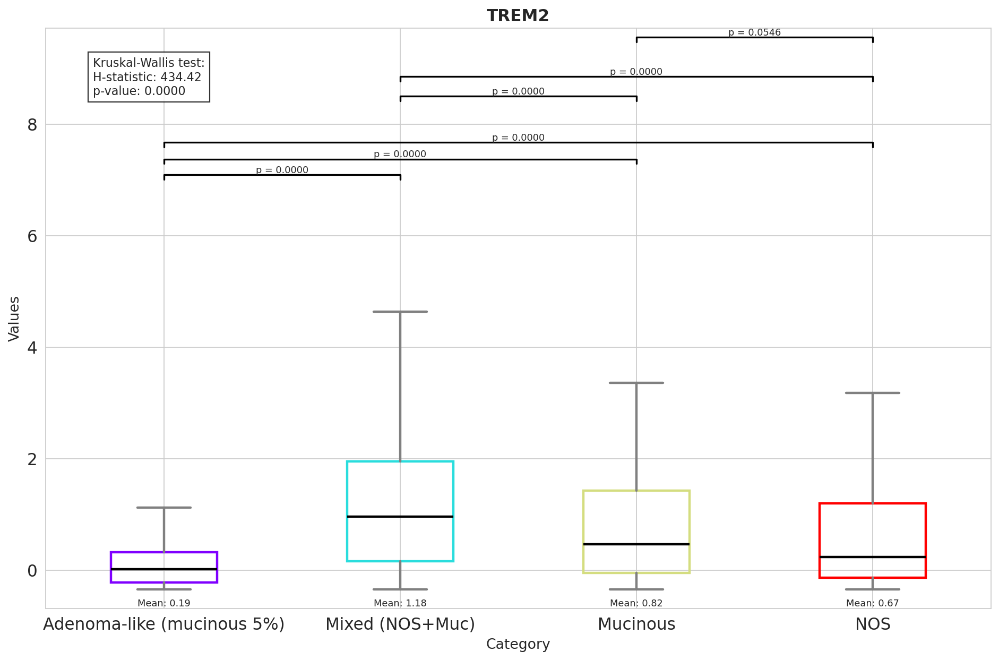

/tmp/ipykernel_15611/1876089823.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns = {name.lower():'value','histological_variants':'group'},inplace = True)


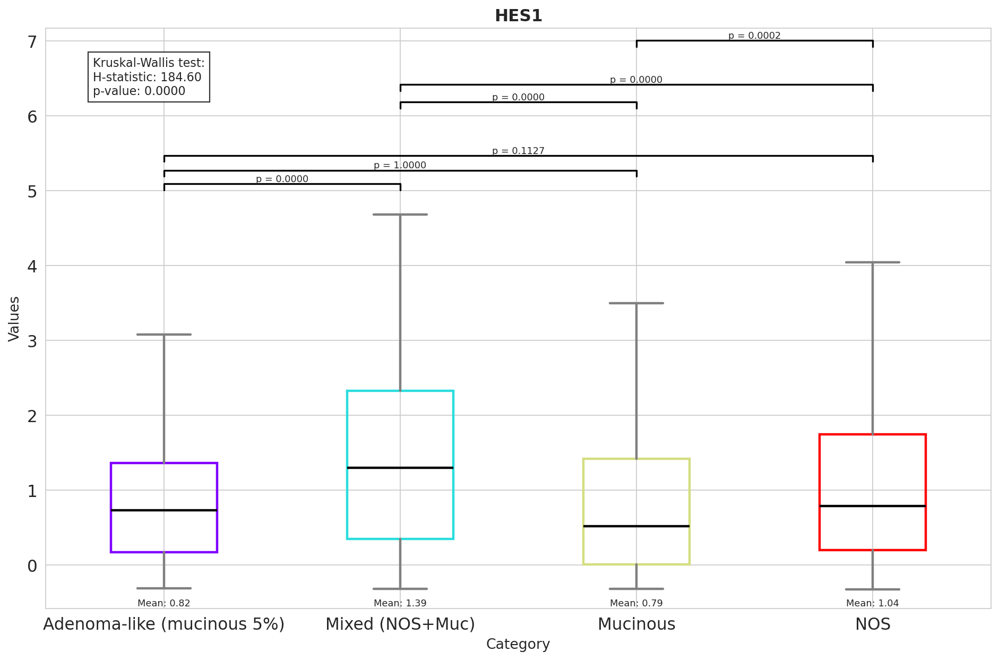

/tmp/ipykernel_15611/1876089823.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns = {name.lower():'value','histological_variants':'group'},inplace = True)


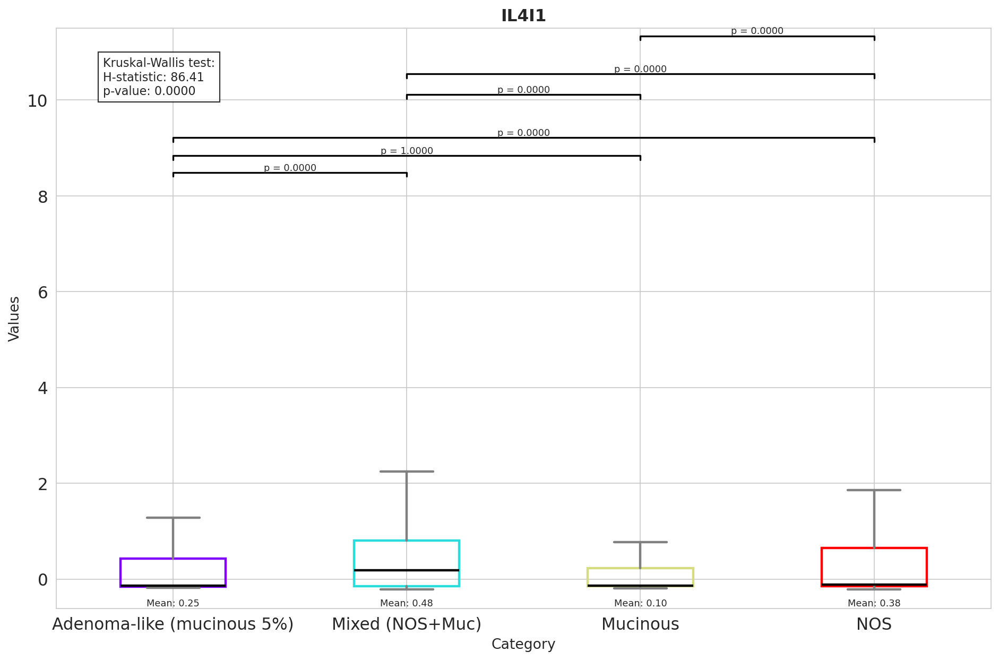

/tmp/ipykernel_15611/1876089823.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns = {name.lower():'value','histological_variants':'group'},inplace = True)


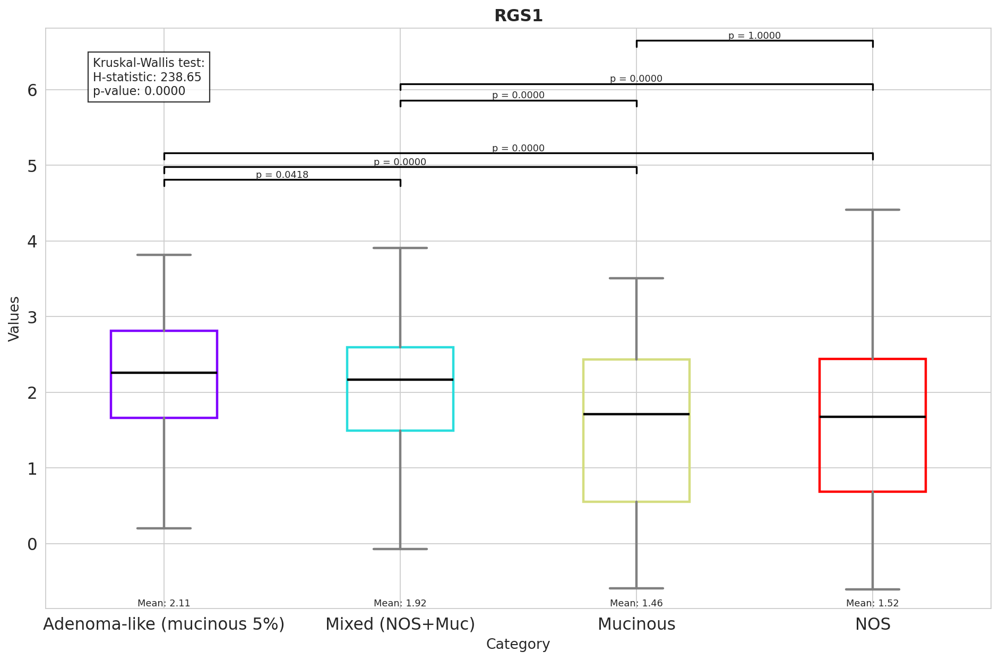

/tmp/ipykernel_15611/1876089823.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns = {name.lower():'value','histological_variants':'group'},inplace = True)


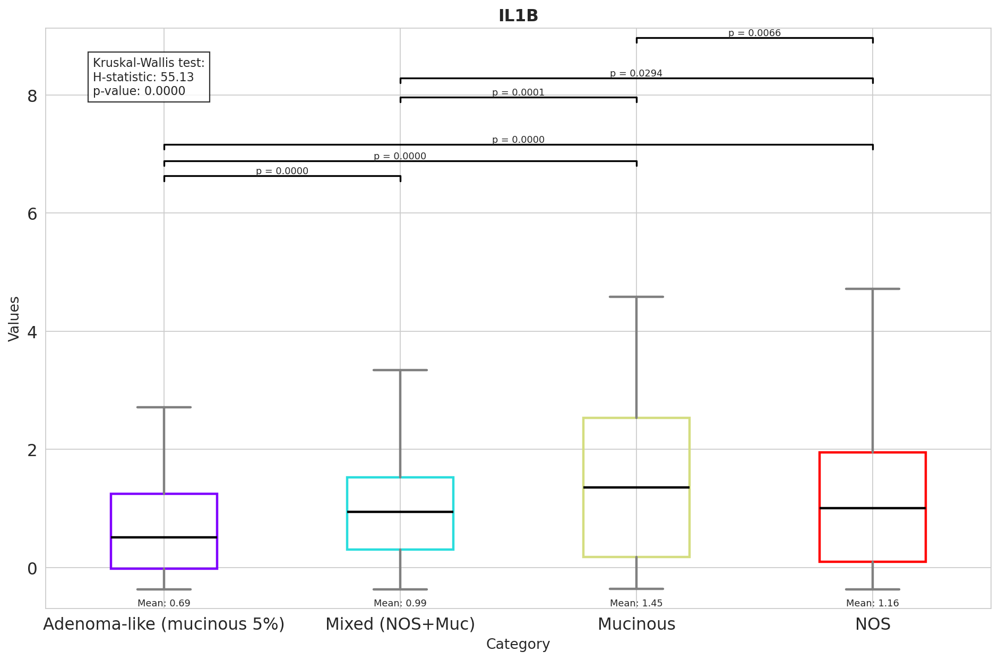

/tmp/ipykernel_15611/1876089823.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns = {name.lower():'value','histological_variants':'group'},inplace = True)


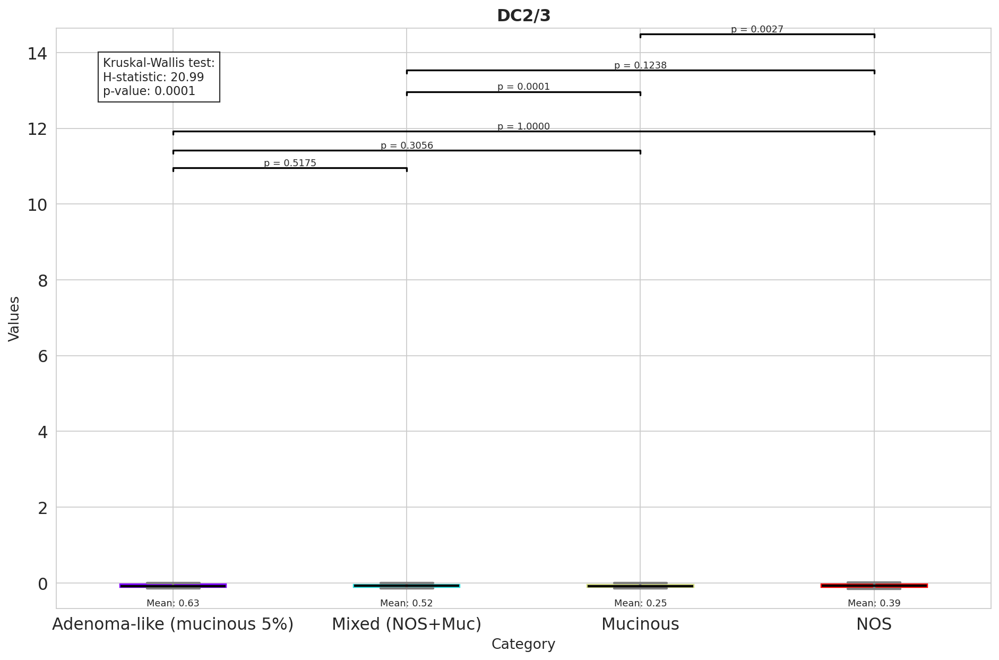

/tmp/ipykernel_15611/1876089823.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns = {name.lower():'value','histological_variants':'group'},inplace = True)


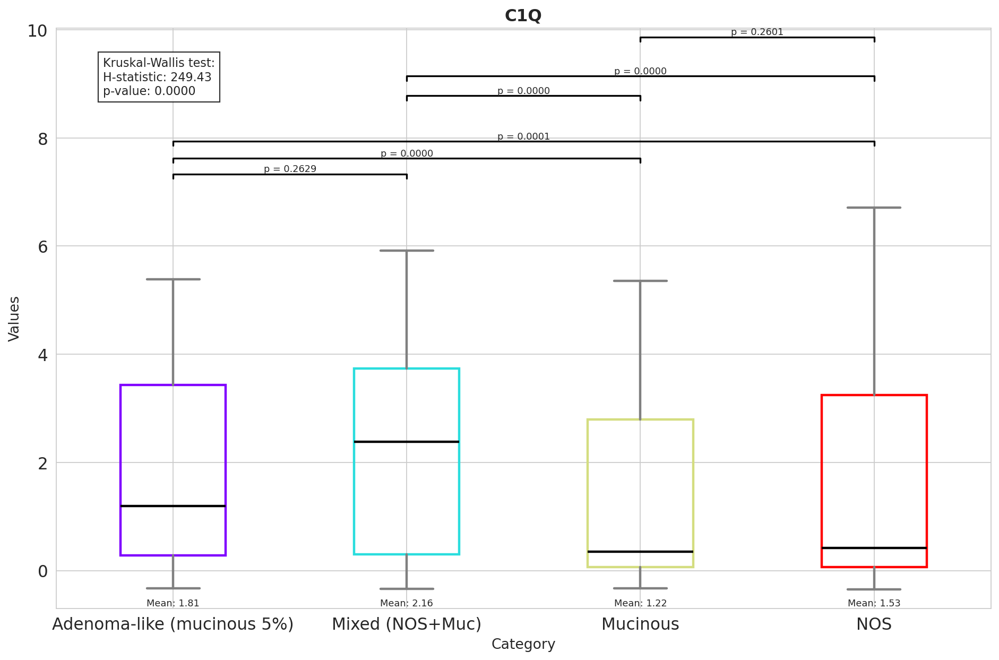

/tmp/ipykernel_15611/1876089823.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns = {name.lower():'value','histological_variants':'group'},inplace = True)


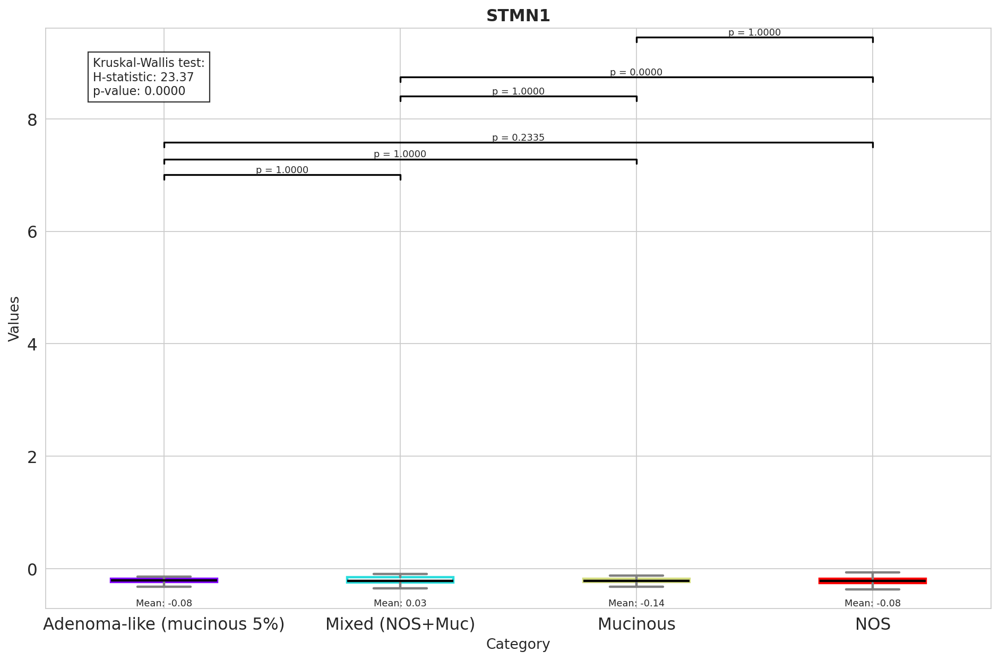

/tmp/ipykernel_15611/1876089823.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns = {name.lower():'value','histological_variants':'group'},inplace = True)


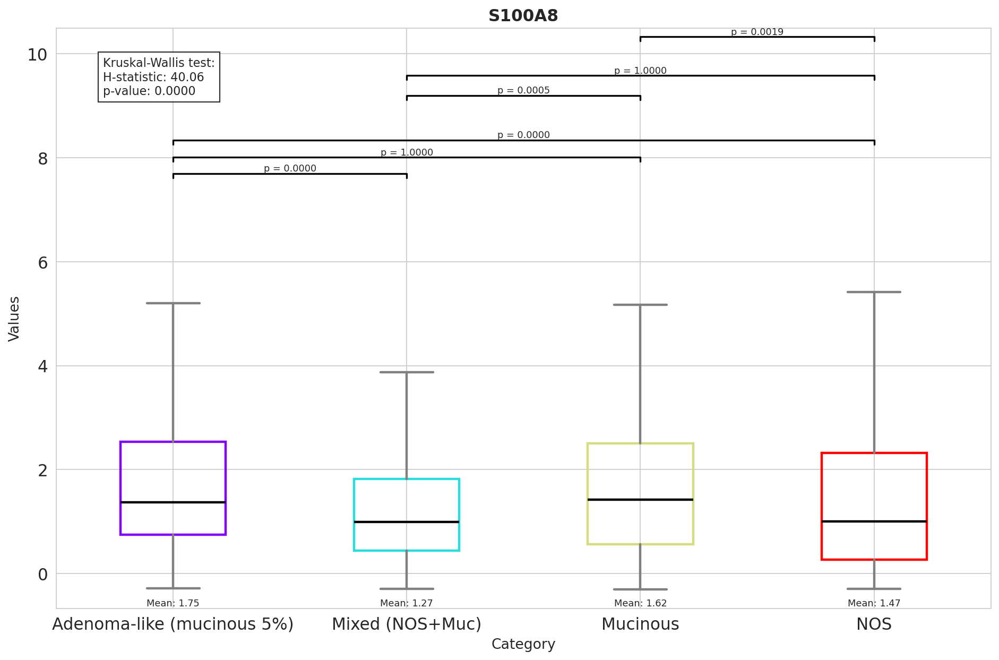

In [25]:
for name in marker_genes_dict.keys():
    df = subset.obs[[name.lower(),'histological_variants']]
    df.rename(columns = {name.lower():'value','histological_variants':'group'},inplace = True)
    values = df.value.values
    categories = df.group.values
    analyze_data(values, categories,name)

In [65]:
x = [[1,2,3,5,1], [12,31,54, np.nan], [10,12,6,74,11],[6,3.1,4,2,1]]
res = sp.posthoc_dunn(x, p_adjust = 'holm')
print(res)

          1         2         3         4
1  1.000000  0.039472  0.060640  1.000000
2  0.039472  1.000000  1.000000  0.085225
3  0.060640  1.000000  1.000000  0.127294
4  1.000000  0.085225  0.127294  1.000000


In [13]:
sc.tl.rank_genes_groups(subset, groupby="histological_variants", method="t-test")

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


/mnt/beegfs/userdata/d_papakonstantinou/scanpy_env/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/mnt/beegfs/userdata/d_papakonstantinou/scanpy_env/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/mnt/beegfs/userdata/d_papakonstantinou/scanpy_env/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/mnt/beegfs/userdata/d_papakonstantinou/scanpy_env/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(


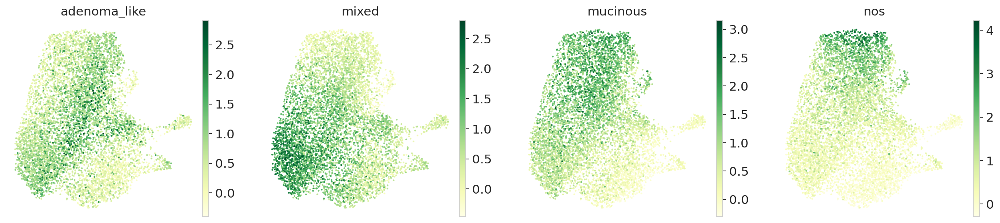

In [14]:
histo_variants = {
'Adenoma_like' : ['HSPA1A', 'LYZ', 'BAG3', 'ZFAND2A', 'DNAJA4', 'SAT1', 'MTRNR2L8', 'THBS1', 'MTCO3P12', 'WDR61', 'HSPA6', 'HLA-DRB1', 'AD000090.1', 'PLIN2', 'MTND2P28', 'DNAJB4', 'AOAH', 'FGL2', 'RNF144B', 'TENT5A', 'MS4A6A', 'MGAT4EP', 'RNASE6', 'AP000648.4', 'C1orf162'],
'Mixed' : ['HLA-DRB5', 'AGR2', 'MUC2', 'REG4', 'TFF3', 'CNNM2', 'HLA-DQA1', 'ZNF302', 'HLA-DRB1', 'TFF1', 'SPARC', 'HLA-DRA', 'MMP9', 'FN1', 'GPNMB', 'PIGR', 'CTSZ', 'FPR3', 'MRC1', 'CAPG', 'LYZ', 'TMEM176B', 'COL1A2', 'HLA-DPA1', 'COL1A1'],
'Mucinous' : ['MTRNR2L1', 'SLC11A1', 'CD163', 'CCL20', 'TIMP1', 'IGHV3-33', 'THBS1', 'RNASE1', 'ACSL1', 'REG1A', 'CLEC5A', 'C1orf162', 'CALB2', 'PLAUR', 'LUCAT1', 'TREM1', 'TGFBI', 'ALOX5AP', 'FPR1', 'SPRR2A', 'IGHV3-64D', 'EREG', 'IGHV1-69', 'SAT1', 'IL1R2'],
'NOS' : ['G0S2', 'OLFM4', 'MTCO1P12', 'NLRP3', 'TIMP1', 'BCL2A1', 'MTND4P12', 'PPIF', 'TNIP3', 'RPL10P9', 'ETS2', 'AC016739.1', 'ACOD1', 'RNF19B', 'BASP1', 'APOBEC3A', 'PLEK', 'SAT1', 'IGHG4', 'MTCO2P22', 'MMP19', 'S100A12', 'OASL', 'CCRL2', 'OLR1']
}

for key in histo_variants:
    subset.obs[key.lower()] = np.mean([subset.X[:, subset.var_names == gene].sum(axis=1) for gene in histo_variants[key]], axis=0)
    
sc.pl.umap(subset, color=[x.lower() for x in histo_variants.keys()], 
           legend_loc="on data",
           frameon=False,
           ncols=5, cmap="YlGn"
          )    

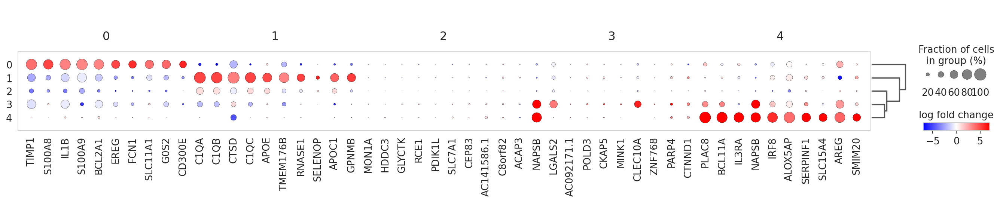

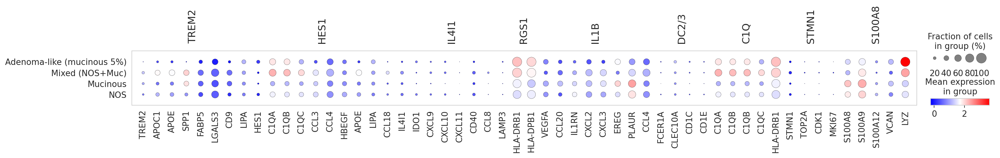

In [26]:
sc.pl.rank_genes_groups_dotplot(
    subset,n_genes=10,values_to_plot="logfoldchanges",
    min_logfoldchange=3, vmax=7,vmin=-7,
    cmap="bwr", #groups= ['NOS','Mucinous']
)

sc.pl.dotplot(subset, marker_genes_dict, groupby="histological_variants",  cmap="bwr")

In [27]:
top_genes = get_top_genes(subset, n_genes=25)
for i in top_genes.columns:
    gene_markers =top_genes[i].to_list()  # Replace with your actual gene list
    print(i,':', ', '.join(gene_markers))

0 : TIMP1, S100A8, IL1B, S100A9, SOD2, BCL2A1, PLAUR, VCAN, EREG, FCN1, SLC11A1, SERPINA1, G0S2, ETS2, CD300E, SLC25A37, IL1RN, OLR1, VEGFA, PPIF, TREM1, C15orf48, PTGS2, ACSL1, SAT1
1 : C1QA, C1QB, CTSD, C1QC, CTSB, CTSZ, APOE, TMEM176B, RNASE1, SELENOP, GRN, APOC1, GPNMB, CAPG, CD14, SLC40A1, SLC7A8, INF2, DSC2, GCNT1, MUC5B, NHSL1, HLA-DRA, EIF5AL1, TPTE2P5
2 : PLAAT2, IGHV1-3, IGLL5, STBD1, AL139383.1, GAS1RR, HCG27, AC138028.4, ZNF608, IGLV2-8, CD79A, IGHV7-4-1, UCHL1, PLEKHN1, IGLV4-69, IGLV2-23, HTRA2, PAEP, IGLV7-43, STIM2-AS1, AC245060.4, CCNI2, IGHV3-72, EEF2KMT, FAM149A
3 : HLA-DPB1, HLA-DPA1, HLA-DQB1, HLA-DRB1, NAPSB, HLA-DQA1, HLA-DRA, CST7, CST3, LGALS2, LTB, TUBA1B, CCND1, PADI2, RMI2, AL109615.3, C12orf75, ADGRG6, DTL, CCSER1, NR2C2AP, VRK1, IRF6, LINC02195, AMOT
4 : GZMB, PLAC8, IRF4, CLIC3, BCL11A, TSPAN13, IL3RA, C12orf75, SOX4, NAPSB, IRF8, ALOX5AP, SERPINF1, SCT, SLC15A4, MZB1, AREG, PPP1R14A, LTB, TCL1A, TPM2, SMPD3, STMN1, SIDT1, SMIM20


In [28]:
print(len(subset.var_names))
print(len(subset.obs))
print(subset.X.shape)
subset.obs = subset.obs.assign(numeric_index = lambda x: range(len(x)))
NOS_indices = subset.obs.loc[subset.obs['histological_variants'] == 'NOS'].numeric_index.to_list()
mixed_indices = subset.obs.loc[subset.obs['histological_variants'] == 'Mixed (NOS+Muc)'].numeric_index.to_list()
adenoma_like_indices = subset.obs.loc[subset.obs['histological_variants'] == 'Adenoma-like (mucinous 5%)'].numeric_index.to_list()
mucinous_indices = subset.obs.loc[subset.obs['histological_variants'] == 'Mucinous'].numeric_index.to_list()

6892
7749
(7749, 6892)


/tmp/ipykernel_15611/4267287117.py:11: RuntimeWarning: invalid value encountered in log2
  logfold = np.log2(np.mean(mat1[i,:])/np.mean(mat2[i,:]))


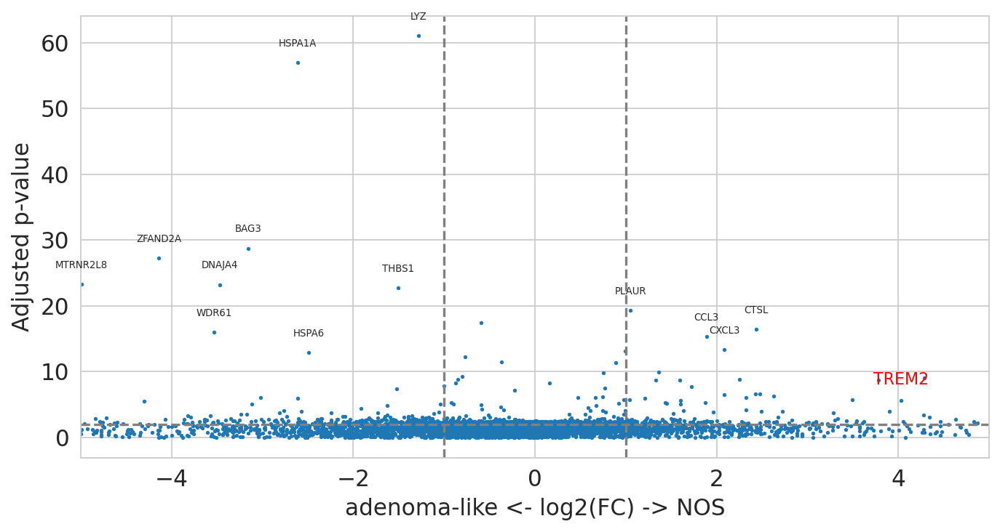

/tmp/ipykernel_15611/4267287117.py:20: RuntimeWarning: divide by zero encountered in log10
  ys = [ -np.log10(x[1]) for x in coords]


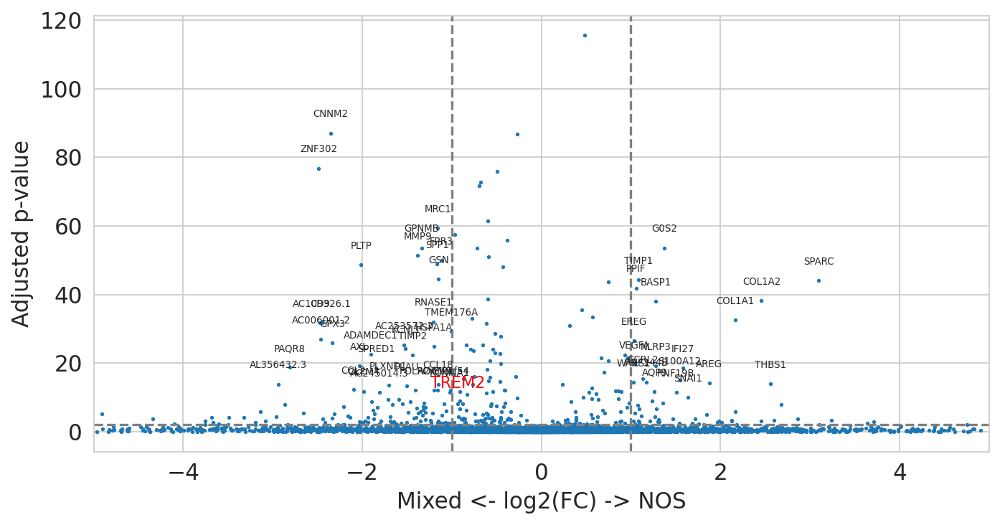

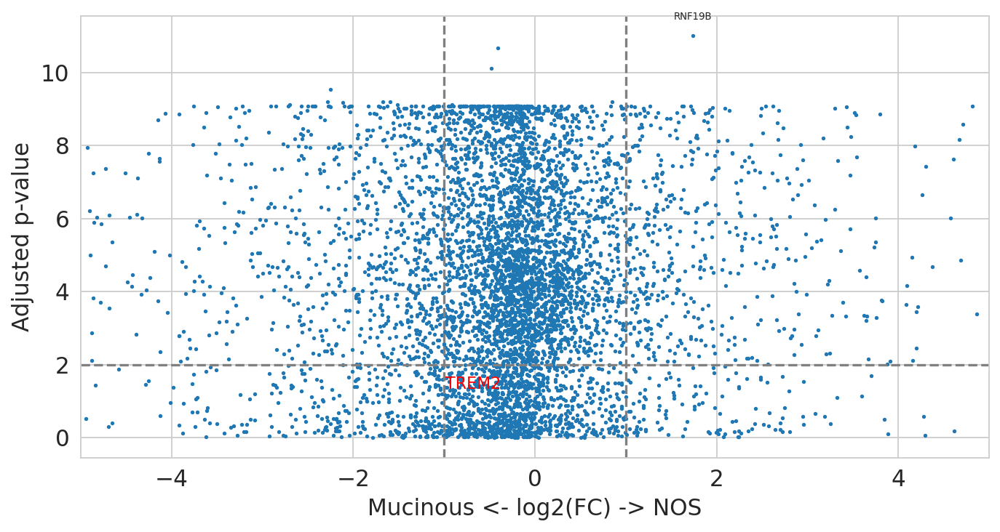

In [29]:
from scipy.stats import wilcoxon,mannwhitneyu,kruskal,f_oneway,ttest_ind
from statsmodels.stats.multitest import multipletests
import matplotlib.pyplot as plt


def deg_function(mat1,mat2):
    pvalues = []
    logfolds = []
    for i in range(len(mat1)):
        statistic, pvalue = mannwhitneyu(mat1[i,:], mat2[i,:])
        logfold = np.log2(np.mean(mat1[i,:])/np.mean(mat2[i,:]))
        logfolds.append(logfold)
        pvalues.append(pvalue)
    
    reject, adj_pvalues, _, _ = multipletests(pvalues, alpha=0.05, method='fdr_bh')
    return list(zip(logfolds,adj_pvalues))

def plot_de(coords,title):
    xs = [x[0] for x in coords]
    ys = [ -np.log10(x[1]) for x in coords]
    plt.figure(figsize=(10, 5))
    plt.scatter(xs, ys, s=2)
    for i, (x,y) in enumerate(zip(xs,ys)):
        label = genes[i]
        if label == 'TREM2':
            plt.annotate(label, # Text to display
            (x, y), # Position of the text (x, y)
            textcoords="offset points", # How to position the text
            xytext=(0, 10), # Offset of the text from the point (x, y)
            ha='center',
            fontsize = 10,color = 'r') # Horizontal alignment

        if (x >1 or x < -1) and y > 10 :
            plt.annotate(label, # Text to display
            (x, y), # Position of the text (x, y)
            textcoords="offset points", # How to position the text
            xytext=(0, 10), # Offset of the text from the point (x, y)
            ha='center',
            fontsize = 6) # Horizontal alignment

    plt.axhline(y=-np.log10(0.01), color='grey', linestyle='--')
    plt.axvline(x=1, color='grey', linestyle='--', label='Line at x=1')
    plt.axvline(x=-1, color='grey', linestyle='--', label='Line at x=-1')
    plt.xlim(left=-5, right=5) # Set the range from 1 to 5
    plt.xlabel(title)
    plt.ylabel('Adjusted p-value')
    plt.show()
    
genes = subset.var_names.tolist()
adenoma_like_subset = subset.X[adenoma_like_indices].transpose()
nos_subset = subset.X[NOS_indices].transpose()
mixed_subset = subset.X[mixed_indices].transpose()
mucinous_subset = subset.X[mucinous_indices].transpose()

coords = deg_function(nos_subset,adenoma_like_subset)
plot_de(coords,"adenoma-like <- log2(FC) -> NOS")

coords = deg_function(nos_subset,mixed_subset)
plot_de(coords,"Mixed <- log2(FC) -> NOS")

coords = deg_function(nos_subset,mucinous_subset)
plot_de(coords,"Mucinous <- log2(FC) -> NOS")

In [30]:
# Retrieve the results for the treated vs. control comparison
results = subset.uns["rank_genes_groups"]['params']
print(results)

{'groupby': 'clusters', 'reference': 'rest', 'method': 'wilcoxon', 'use_raw': True, 'layer': None, 'corr_method': 'benjamini-hochberg'}
